# Notebook to run basic analysis on Raw data before cellbender

# Importing packages

In [1]:
import anndata as ad
import scanpy as sc
import os
import random
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from scipy.stats import median_abs_deviation

In [2]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 300, color_map = 'RdPu', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.10.8
scanpy      1.10.1
-----
PIL                 10.3.0
asttokens           NA
cffi                1.16.0
charset_normalizer  3.3.2
colorama            0.4.6
comm                0.2.2
cycler              0.12.1
cython_runtime      NA
dateutil            2.9.0.post0
debugpy             1.8.2
decorator           5.1.1
defusedxml          0.7.1
django              5.0.6
executing           2.0.1
h5py                3.11.0
igraph              0.11.5
ipykernel           6.29.5
ipython_genutils    0.2.0
ipywidgets          8.1.3
jedi                0.19.1
joblib              1.4.2
kiwisolver          1.4.5
legacy_api_wrap     NA
leidenalg           0.10.2
llvmlite            0.43.0
matplotlib          3.8.4
mpl_toolkits        NA
natsort             8.4.0
numba               0.60.0
numexpr             2.10.1
numpy               2.0.0
packaging           24.1
pandas              2.2.2
parso               0.8.4
patsy               0.5.6
platformdirs        4.2.2
plotly    

In [3]:
ref = sc.read_h5ad('../../data/ref_labelled_dmd.h5ad')
ref

/home/skolla/miniforge3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 147345 × 32285
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'C_scANVI', 'cell_type-broad', 'orig.ident', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'annotation_broad', 'annotation_detailed', 'sample_id', 'nCount_HTO', 'nFeature_HTO', 'HTO_classification', 'Library', 'CD45_Annotation', 'MPC_Annotation', 'compartment'
    obsm: 'X_scANVI', 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs'

In [4]:
ref.obs_names_make_unique()
ref

/home/skolla/miniforge3/envs/scanpy/lib/python3.12/site-packages/anndata/utils.py:260: UserWarning: Suffix used (-[0-9]+) to deduplicate index values may make index values difficult to interpret. There values with a similar suffixes in the index. Consider using a different delimiter by passing `join={delimiter}`Example key collisions generated by the make_index_unique algorithm: ['AACAAGAAGTTGAATG-1_1-MDX_POOL_NEW-1', 'AACACACTCGGCTGAC-1_1-MDX_POOL_NEW-1', 'AACCTTTAGGTTGGAC-1_1-MDX_POOL_NEW-1', 'AACGTCATCGGTCAGC-1_1-MDX_POOL_NEW-1', 'AATGCCACAATACCCA-1_1-MDX_POOL_NEW-1']
  warnings.warn(


AnnData object with n_obs × n_vars = 147345 × 32285
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'C_scANVI', 'cell_type-broad', 'orig.ident', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'annotation_broad', 'annotation_detailed', 'sample_id', 'nCount_HTO', 'nFeature_HTO', 'HTO_classification', 'Library', 'CD45_Annotation', 'MPC_Annotation', 'compartment'
    obsm: 'X_scANVI', 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs'

In [5]:
def X_is_raw(adata):
    return np.array_equal(adata.X.sum(axis=0).astype(int), adata.X.sum(axis=0))

is_raw = X_is_raw(ref)
print(is_raw)

False


In [6]:
sc.pp.neighbors(ref)
sc.tl.umap(ref)

computing neighbors
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:01:59)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:02:27)
computing UMAP


/home/skolla/miniforge3/envs/scanpy/lib/python3.12/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/home/skolla/miniforge3/envs/scanpy/lib/python3.12/site-packages/sklearn/manifold/_spectral_embedding.py:455: UserWarning: Exited at iteration 1628 with accuracies 
[4.56091204e-15 8.99519064e-06 1.25894850e-05 9.58905588e-06]
not reaching the requested tolerance 9.879469871520996e-06.
Use iteration 1628 instead with accuracy 
7.793432869061845e-06.

  _, diffusion_map = lobpcg(
/home/skolla/miniforge3/envs/scanpy/lib/python3.12/site-packages/sklearn/manifold/_spectral_embedding.py:455: UserWarning: Exited postprocessing with accuracies 
[3.65237999e-15 8.99524671e-06 1.25894317e-05 9.58907319e-06]
not reaching the requested tolerance 9.879469871520996e-06.
  _, diffusion_map = lobpcg(
/home/skolla/miniforge3/envs/scanpy/lib/python3.12/site-packages/umap/spectral.py:550: Use

    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:11)


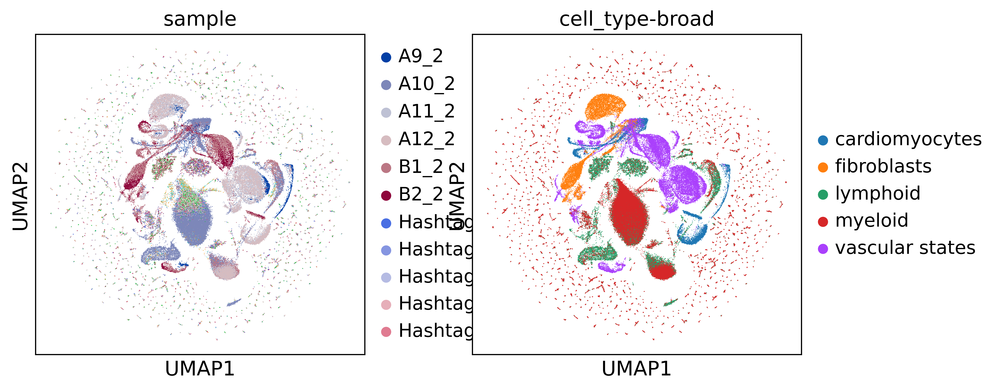

In [7]:
sc.pl.umap(ref, color = ['sample', 'cell_type-broad'])
sc.pl.umap(ref, color= ['Tnnt2','Il10', 'Ttn','Dcn','Myh7', 'Dmd','Ctnna3','Lama2','Ryr2', 'Cd44'])